# NK cells

## Cell (sub)types, cell exhaustion and markers

After subsetting the NK cells, assigning resident and exhausted labels scoring the markers expression and repeating the batch correction and UMAP represtation, let's see some features including:
- Cells distributions
- Proportions of exhausted and resident cells
- Markers expressed by the different sub-groups
- easy trajectory inference?

scPOP given the best result (in dividing the cell (sub)types) as the scVI with 50 latent dimension ad the neighbours graph with 35 neighbours.

In [1]:
# prepare environmnet
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats as ss ## stat functions from scipy
#import scikit_posthocs as sp  ## stat functions from scikit
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns
from statannotations.Annotator import Annotator ## add nice annotation ans statistical testing on plot
import statannotations as sta
from IPython.display import display ## display figure in order
import warnings ## ignore warnings
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(20, 10))

In [2]:
adata = sc.read("./Data/nk_cells_processed.h5ad") # load dataset
latent = sc.read("./Data/nk_cells_tmp_2000_30_latent.h5ad") # load latent space representation

In [3]:
sc.pp.neighbors(latent, n_neighbors=50)
sc.tl.umap(latent)

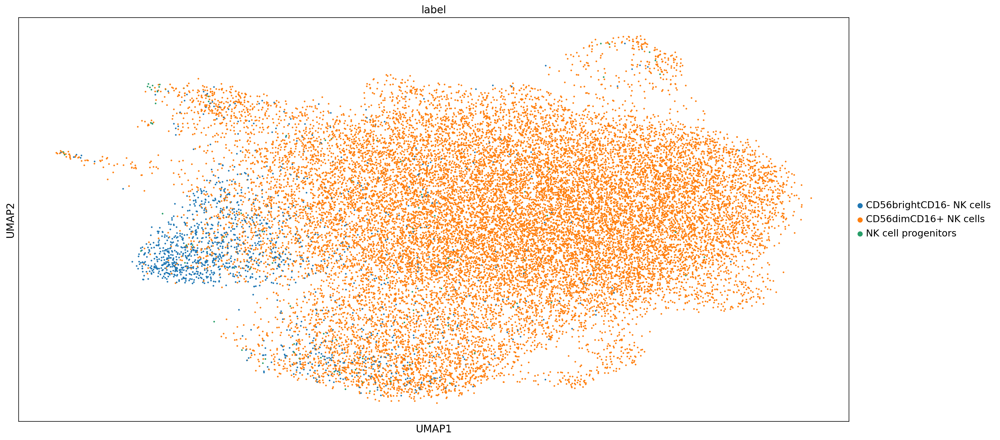

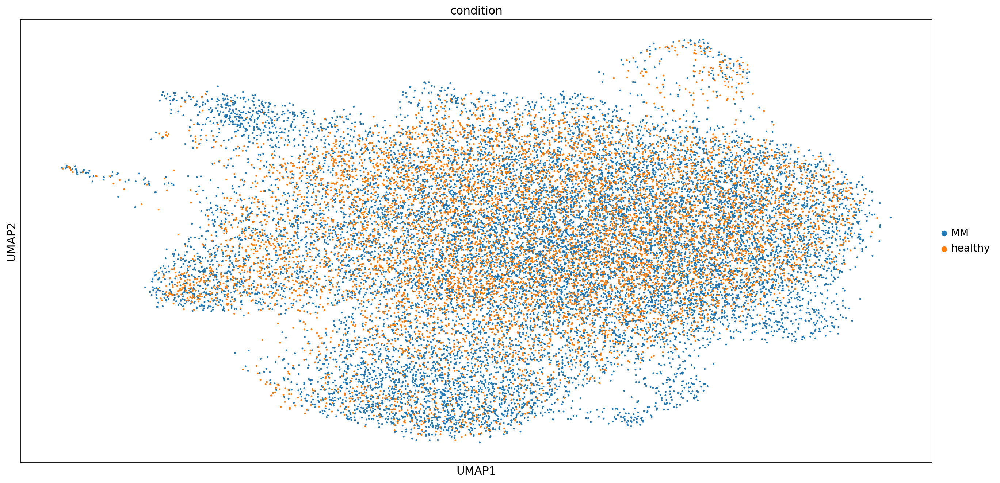

CD56dimCD16+ NK cells       20824
CD56brightCD16- NK cells     1461
NK cell progenitors            96
Name: label, dtype: int64

In [4]:
sc.pl.umap(latent, color="label", size=20, save="_celltypes.png")
sc.pl.umap(latent, color="condition", size=20, save="_condition.png")
adata.obs.label.value_counts()

In [5]:
adata.uns = latent.uns
adata.obsm = latent.obsm
adata.obsp = latent.obsp

In [6]:
adata.write("Data/nk_raw_umap.h5ad")

As showed in the UMAP representations, CD56<sup>bright</sup> and CD56<sup>dim</sup> cells doesn't segregate well. Most of the cells are CD56<sup>dim</sup> (17999). Cells from MM patients and healthy controls distribute evenly in the UMAP, suggesting the transcriptional differences (if they exist), are limited to key genes that can regulate NK cells activity.

In [7]:
def plot_cells(cells, label_column, name):
    #cells.append("Not selected")
    myvector = adata.obs[label_column]
    myvector = myvector.cat.set_categories(new_categories=cells)
    #myvector = myvector.fillna("Not selected")
    adata.obs["selected_cells"] = myvector
    #print(adata.obs["selected_cells"])
    sc.pl.umap(adata, color = "selected_cells", size=30, save=name)

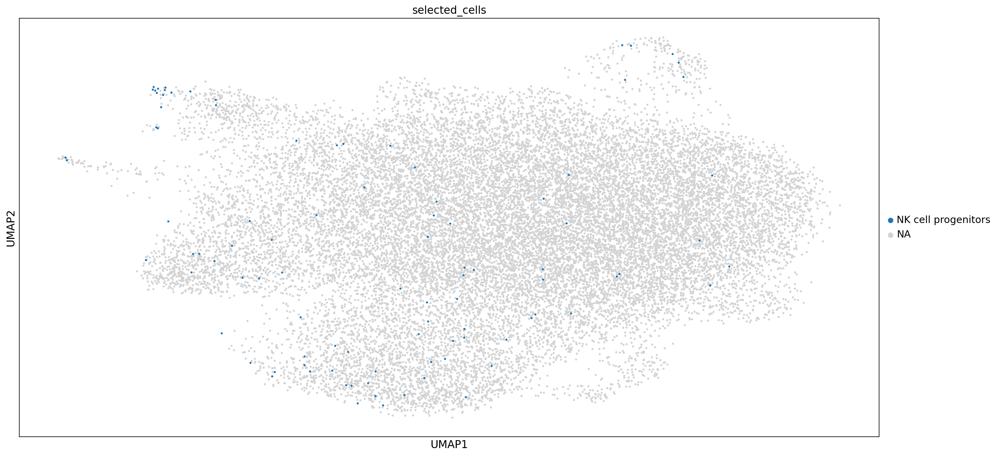

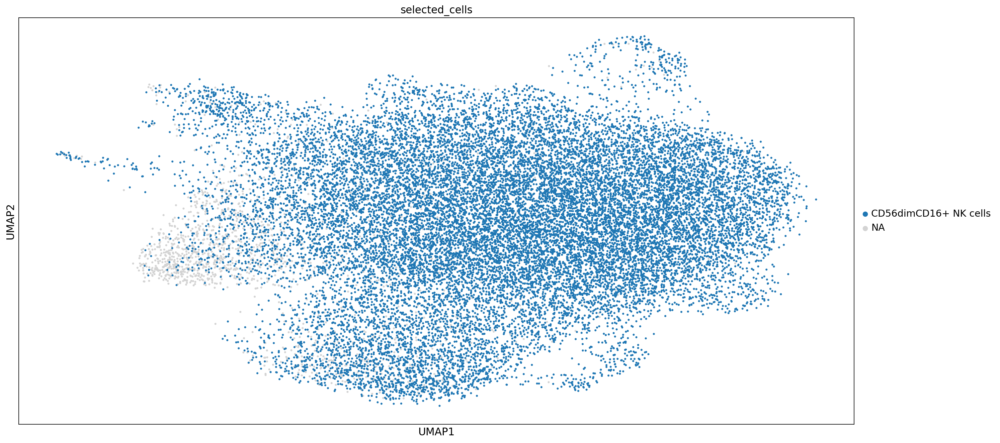

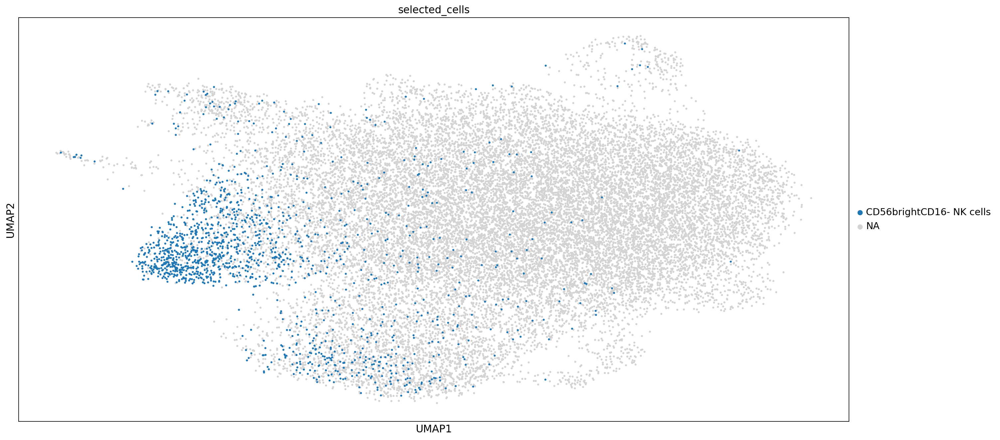

In [8]:
plot_cells(["NK cell progenitors"], "label", "NK_progenitors.png")
plot_cells(["CD56dimCD16+ NK cells"], "label", "NK_CD56dim.png")
plot_cells(["CD56brightCD16- NK cells"], "label", "NK_CD56bright.png")

NK progenitors and CD56<sup>dim</sup> cells distribute evenly in the map, CD56<sup>bright</sup> distribute more in the upper right side of the map. Now I will conitnue with the analysis and eventually consider other methods to remove the batch effect (Harmony).

## Resident and exhausted cells in the complete dataset:

Also the labels between resident and exhasuted cells doesn't segregate in the UMAP:

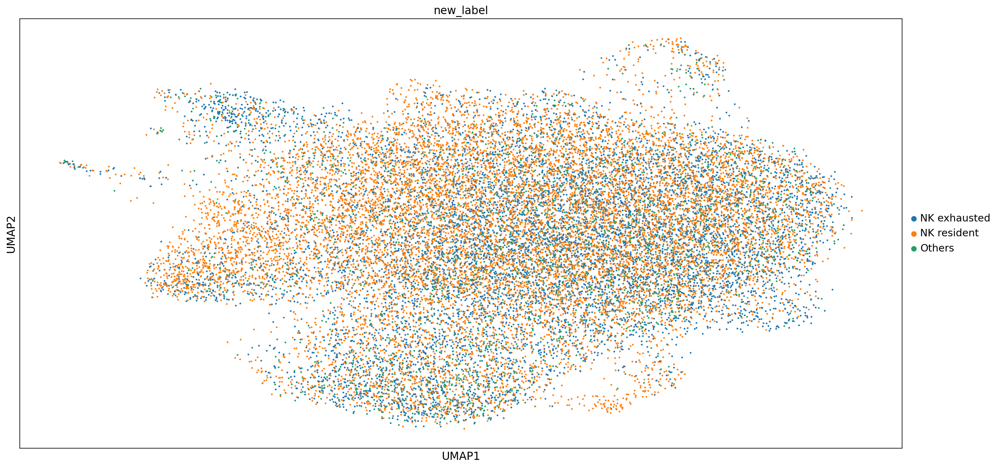

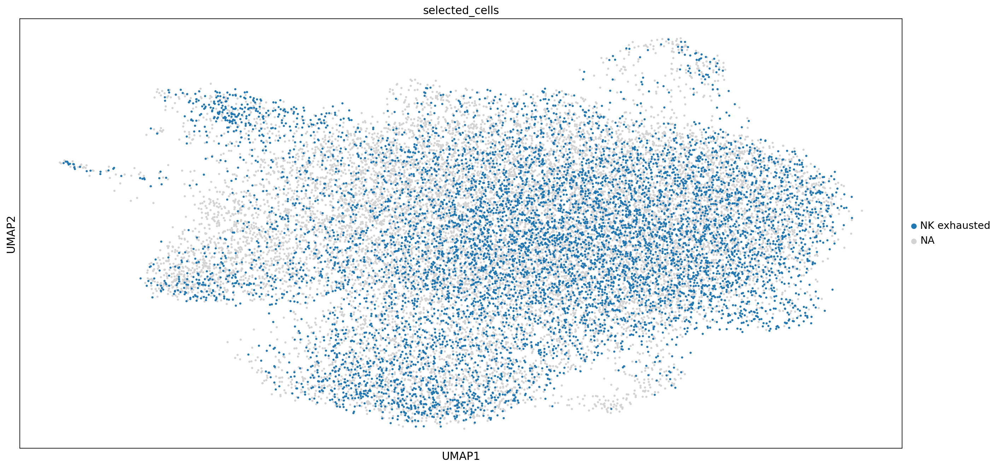

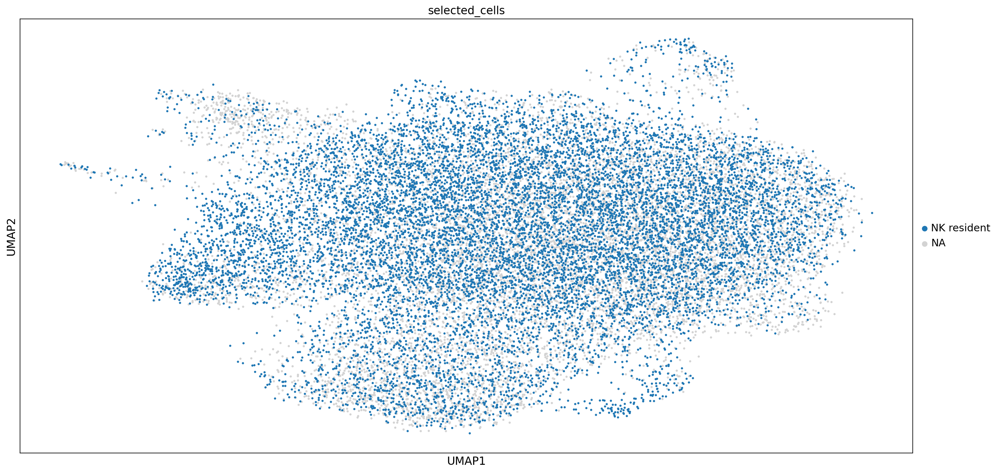

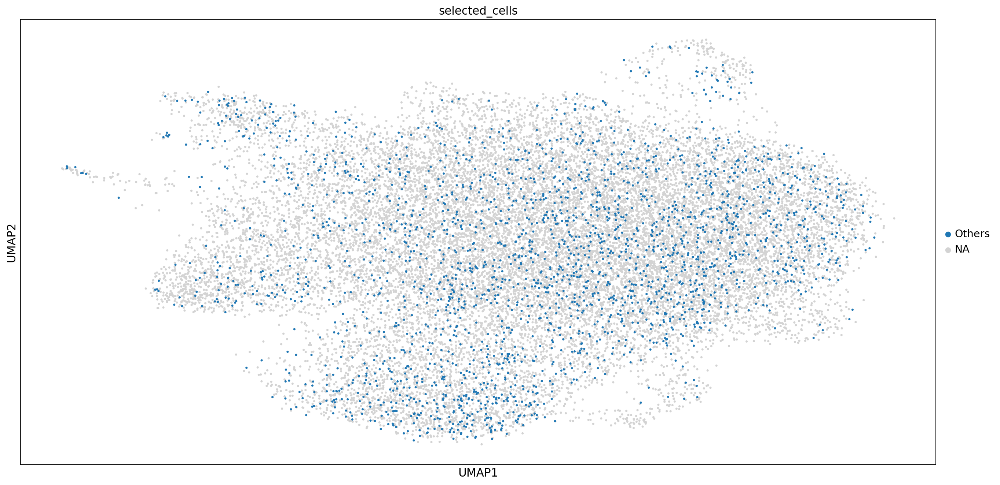

In [9]:
sc.pl.umap(adata, color="new_label", size=20)
plot_cells(["NK exhausted"], "new_label", "NK_progenitors.png")
plot_cells(["NK resident"], "new_label", "NK_CD56dim.png")
plot_cells(["Others"], "new_label", "NK_CD56bright.png")

## Proportions:

In [10]:
healthy = adata[adata.obs["condition"] == "healthy"]
batches = pd.DataFrame(adata.obs.batch.unique()) # get list of batches
bm = batches[batches[0].str.contains("BM")] # filter considering only batches that contain "BM" (unsorted bone marrow)
bm = bm[0].values.tolist() # convert to list
adata = adata[adata.obs["batch"].isin(bm)] # create anndata object with only bm samples
mm = adata[adata.obs["condition"] == "MM"]

In [11]:
healthy_cells = pd.DataFrame(healthy.obs.label.value_counts())
healthy_cells["label"] = (healthy_cells["label"]/sum(healthy_cells["label"]))*100
mm_cells = pd.DataFrame(mm.obs.label.value_counts())
mm_cells["label"] = (mm_cells["label"]/sum(mm_cells["label"]))*100

In [12]:
cells = pd.DataFrame()
cells["health"] = healthy_cells["label"]
cells["mm"] = mm_cells["label"]
cells.index = mm_cells.index

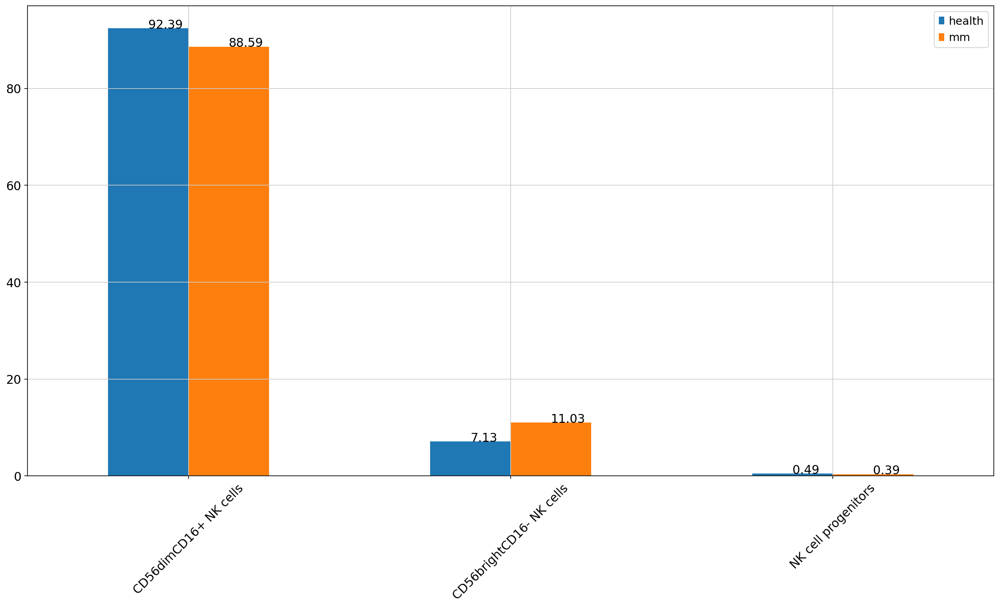

In [13]:
fig, ax = plt.subplots()
cells.plot.bar(ax=ax)
plt.xticks(rotation=45)
for p in ax.patches: 
    ax.annotate(np.round(p.get_height(),decimals=2), (p.get_x()+p.get_width()/2., p.get_height()))

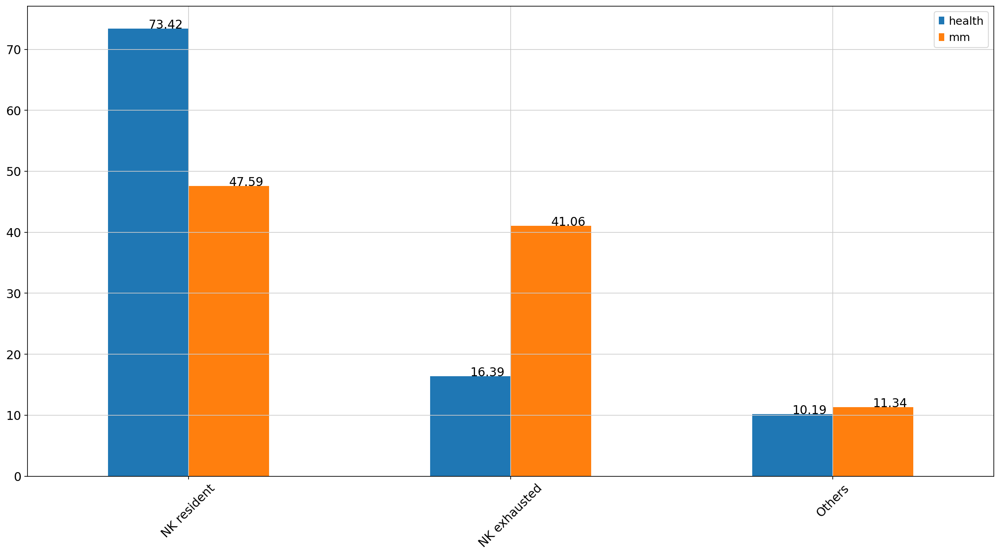

In [14]:
healthy_cells = pd.DataFrame(healthy.obs.new_label.value_counts())
healthy_cells["new_label"] = (healthy_cells["new_label"]/sum(healthy_cells["new_label"]))*100
mm_cells = pd.DataFrame(mm.obs.new_label.value_counts())
mm_cells["new_label"] = (mm_cells["new_label"]/sum(mm_cells["new_label"]))*100
cells = pd.DataFrame()
cells["health"] = healthy_cells["new_label"]
cells["mm"] = mm_cells["new_label"]
cells.index = mm_cells.index
fig, ax = plt.subplots()
cells.plot.bar(ax=ax)
plt.xticks(rotation=45)
for p in ax.patches: 
    ax.annotate(np.round(p.get_height(),decimals=2), (p.get_x()+p.get_width()/2., p.get_height()))

In [15]:
def proportions(adata, batches,label): # create dataframe with cell types proportion for the given batches
    df = pd.DataFrame() # create empty dataframe
    for b in batches: #iterate along all the batches desired
        temp = adata[adata.obs.batch == b] # create temporary file with cell from desired batch
        cells = temp.obs[label].value_counts() # get counts
        total_cells = cells.sum() # sum cells
        proportions = (cells/total_cells)*100 # get percentage 
        df = df.append(proportions) # append the cell proortions of the give batches to the df (as rows)
    df.index = batches # rownames as batches
    return df

def celltype(label,condition,table): # create tidy (long) dataframe of the cell proportion for the given cell type
    cell_type = {} # create empty dictionary
    for i in range(0,len(condition)): # iterate along the conditions
        cell_type[condition[i]] = table[i][label].values.tolist() #extract the proportion of the desired cell type
    cell_type = pd.DataFrame.from_dict(cell_type, orient="index").transpose() # convert to pandas dataframe
    cell_type["cell"] = label # add column with cell type
    cell_type_long = pd.melt(cell_type, id_vars="cell", value_vars=condition) # pivot longer
    return cell_type, cell_type_long

In [16]:
batches = healthy.obs.batch.unique().tolist() # healthy batches
health = proportions(healthy, batches, "label")

# SMM
batches = mm.obs.batch.unique().tolist() # get batches from MM dataset (BM)
batches = [x for x in batches if 'SMM' in x] # keep only those who contains SMM
SMM = proportions(adata,batches, "label") # get proportions

# PMM
batches = mm.obs.batch.unique().tolist()
batches = [x for x in batches if 'PMM' in x]
PMM = proportions(adata,batches, "label")

# RRMM
batches = mm.obs.batch.unique().tolist()
batches = [x for x in batches if 'RRMM' in x]
RRMM = proportions(adata,batches, "label")

In [17]:
conditions = ["health", "SMM", "PMM", "RRMM"] # list conditions as string
tables = [health, SMM, PMM, RRMM] # list of conditions dataframes
list_cells = mm.obs.label.value_counts().index

cell_proportions = {} #create new empty dictionary to iterate all the cell types
cell_proportions_long = {}

for c in list_cells:
    cell_proportions[c], cell_proportions_long[c] = celltype(c, conditions, tables)

cells = pd.concat(cell_proportions_long,ignore_index=True) # concatenate the cells
cells.columns = ["cell", "condition", "proportions"]
cells.to_csv("nk_analysis/cell_proportions_tidy.csv",index=False)

In [18]:
# let's do some statistics:
pairs=[("health", "SMM"),("health", "PMM"),("health", "RRMM"),("SMM", "PMM"),("SMM", "RRMM"),("PMM","RRMM")]
def statistics():
    significant = []
    for cell in list_cells:
        
        title = cell       
        fig = plt.figure()
        ax = sns.boxplot(data=cell_proportions_long[cell], x = "variable", y= "value",showfliers = False)
        ax = sns.stripplot(data=cell_proportions_long[cell], x="variable", y="value", alpha=0.7, color="black")
        fig = plt.xlabel("Condition")
        fig = plt.ylabel("Proportion(%)")
        fig = plt.title(title)
        


        pvalues = []
        for a,b in pairs:
            test = ss.mannwhitneyu(x=cell_proportions[cell][a], y=cell_proportions[cell][b], nan_policy="omit").pvalue
            pvalues.append(test)

        pair_2=[]
        good_pv=[]
        formatted_pvalues = ["" if p == np.nan else p for p in pvalues]
        for index, value in enumerate(pvalues):
            if value <0.05:
                pair_2.append(pairs[index])
                good_pv.append(value)
 
        if len(pair_2)<1:
            #print(f"There are no significant thingis for {cell} :C")
            display(fig)

            plt.show()
            print("\n\n\n\n\n")
        else:
            annotator = Annotator(ax=ax,pairs=pair_2, data=cell_proportions_long[cell], x="variable", y="value", order = conditions)
            #annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
            #annotator.apply_and_annotate()
            annotator.set_pvalues(good_pv)
            annotator.annotate()
            display(fig)

            plt.show()
            print("\n\n\n\n\n")
        
    
    return significant

Text(0.5, 1.0, 'CD56dimCD16+ NK cells')

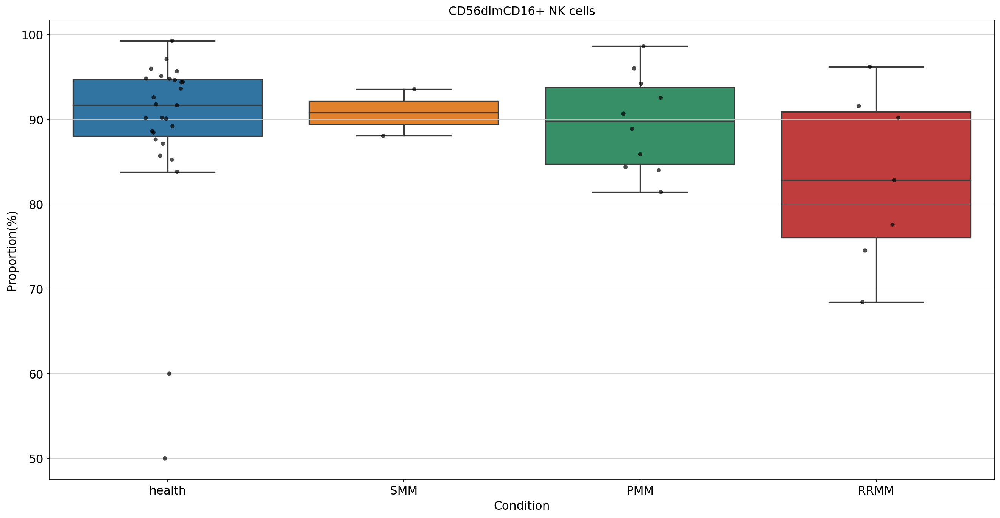

Text(0.5, 1.0, 'CD56brightCD16- NK cells')

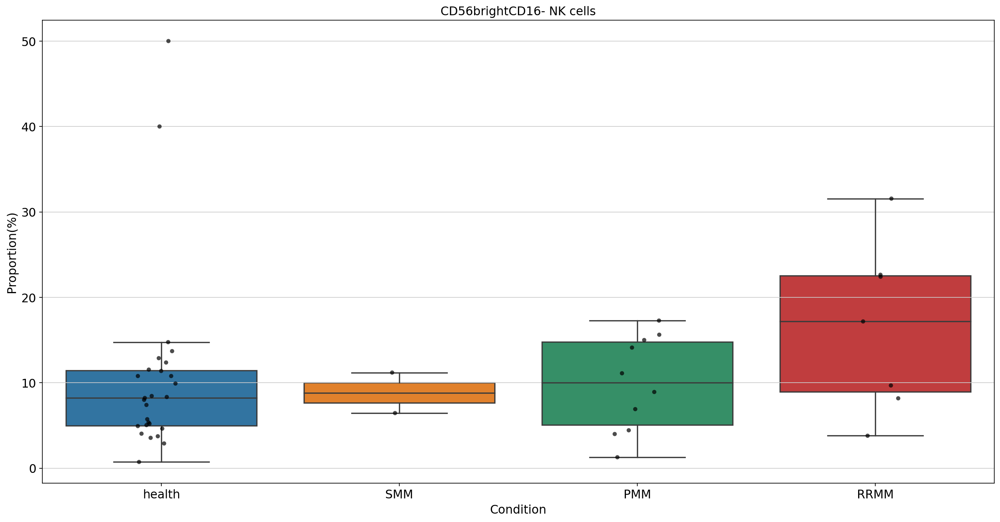

Text(0.5, 1.0, 'NK cell progenitors')

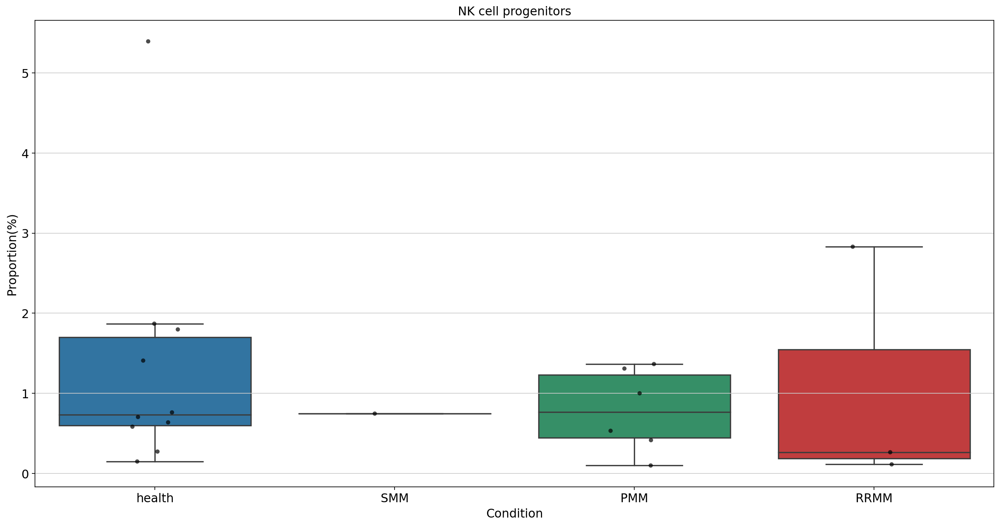

In [19]:
significant = statistics()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

health vs. SMM: Custom statistical test, P_val:2.255e-02
PMM vs. RRMM: Custom statistical test, P_val:2.499e-02
health vs. PMM: Custom statistical test, P_val:8.886e-03
health vs. RRMM: Custom statistical test, P_val:2.108e-04


Text(0.5, 1.0, 'NK resident')

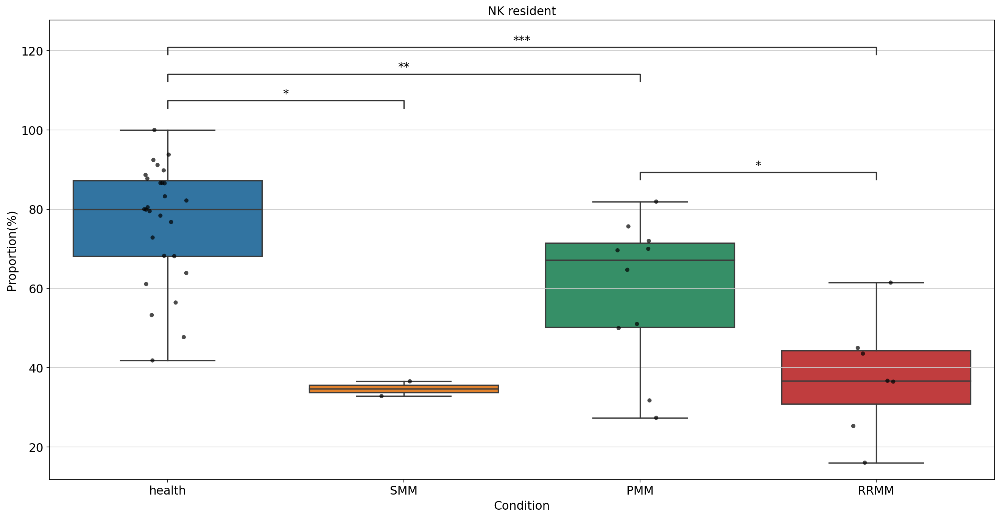







p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

health vs. SMM: Custom statistical test, P_val:5.698e-03
PMM vs. RRMM: Custom statistical test, P_val:1.851e-02
health vs. PMM: Custom statistical test, P_val:2.591e-03
health vs. RRMM: Custom statistical test, P_val:1.188e-06


Text(0.5, 1.0, 'NK exhausted')

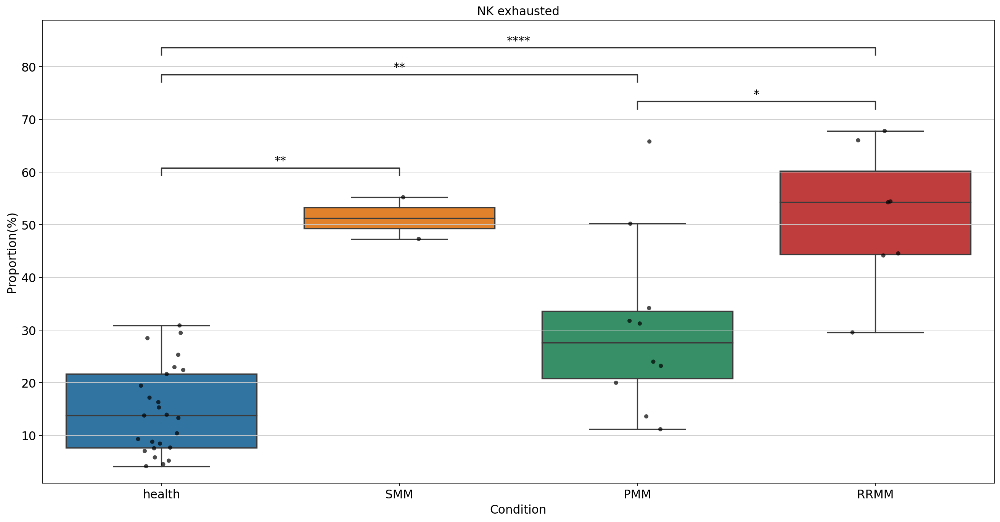

Text(0.5, 1.0, 'Others')

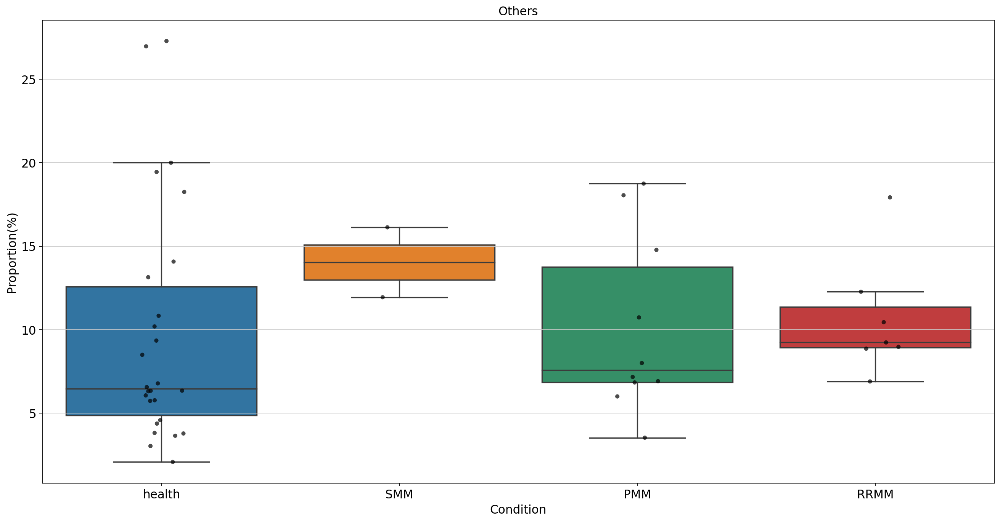

In [20]:
batches = healthy.obs.batch.unique().tolist() # healthy batches
health = proportions(healthy, batches, "new_label")

# SMM
batches = mm.obs.batch.unique().tolist() # get batches from MM dataset (BM)
batches = [x for x in batches if 'SMM' in x] # keep only those who contains SMM
SMM = proportions(adata,batches, "new_label") # get proportions

# PMM
batches = mm.obs.batch.unique().tolist()
batches = [x for x in batches if 'PMM' in x]
PMM = proportions(adata,batches, "new_label")

# RRMM
batches = mm.obs.batch.unique().tolist()
batches = [x for x in batches if 'RRMM' in x]
RRMM = proportions(adata,batches, "new_label")

conditions = ["health", "SMM", "PMM", "RRMM"] # list conditions as string
tables = [health, SMM, PMM, RRMM] # list of conditions dataframes
list_cells = mm.obs.new_label.value_counts().index

cell_proportions = {} #create new empty dictionary to iterate all the cell types
cell_proportions_long = {}

for c in list_cells:
    cell_proportions[c], cell_proportions_long[c] = celltype(c, conditions, tables)

cells = pd.concat(cell_proportions_long,ignore_index=True) # concatenate the cells
cells.columns = ["cell", "condition", "proportions"]
cells.to_csv("nk_analysis/exhausted_proportions_tidy.csv",index=False)
significant = statistics()

Interestingly no differencies in cell types proportions where found between healthy and disease samples. On the other hand, resident and exhausted change between healthy and disease stages. Resident NK cells represent the biggest proportion in healthy samples, NK exhausted cells are more common in disease stages.

In [21]:
mm_cd56_dim = mm[mm.obs["label"] == "CD56dimCD16+ NK cells"]
mm_cd56_bright = mm[mm.obs["label"] == "CD56brightCD16- NK cells"]
mm_prog = mm[mm.obs["label"] == "NK cell progenitors"]
health_cd56_dim = healthy[healthy.obs["label"] == "CD56dimCD16+ NK cells"]
health_cd56_bright = healthy[healthy.obs["label"] == "CD56brightCD16- NK cells"]
health_prog = healthy[healthy.obs["label"] == "NK cell progenitors"]

In [22]:
mm_cd56_dim_cells = pd.DataFrame(mm_cd56_dim.obs.new_label.value_counts())
mm_cd56_dim_cells["new_label"] = (mm_cd56_dim_cells["new_label"]/sum(mm_cd56_dim_cells["new_label"]))*100

mm_cd56_bright_cells = pd.DataFrame(mm_cd56_bright.obs.new_label.value_counts())
mm_cd56_bright_cells["new_label"] = (mm_cd56_bright_cells["new_label"]/sum(mm_cd56_bright_cells["new_label"]))*100

mm_prog_cells = pd.DataFrame(mm_prog.obs.new_label.value_counts())
mm_prog_cells["new_label"] = (mm_prog_cells["new_label"]/sum(mm_prog_cells["new_label"]))*100

health_cd56_dim_cells = pd.DataFrame(health_cd56_dim.obs.new_label.value_counts())
health_cd56_dim_cells["new_label"] = (health_cd56_dim_cells["new_label"]/sum(health_cd56_dim_cells["new_label"]))*100


health_cd56_bright_cells = pd.DataFrame(health_cd56_bright.obs.new_label.value_counts())
health_cd56_bright_cells["new_label"] = (health_cd56_bright_cells["new_label"]/sum(health_cd56_bright_cells["new_label"]))*100

health_prog_cells = pd.DataFrame(health_prog.obs.new_label.value_counts())
health_prog_cells["new_label"] = (health_prog_cells["new_label"]/sum(health_prog_cells["new_label"]))*100

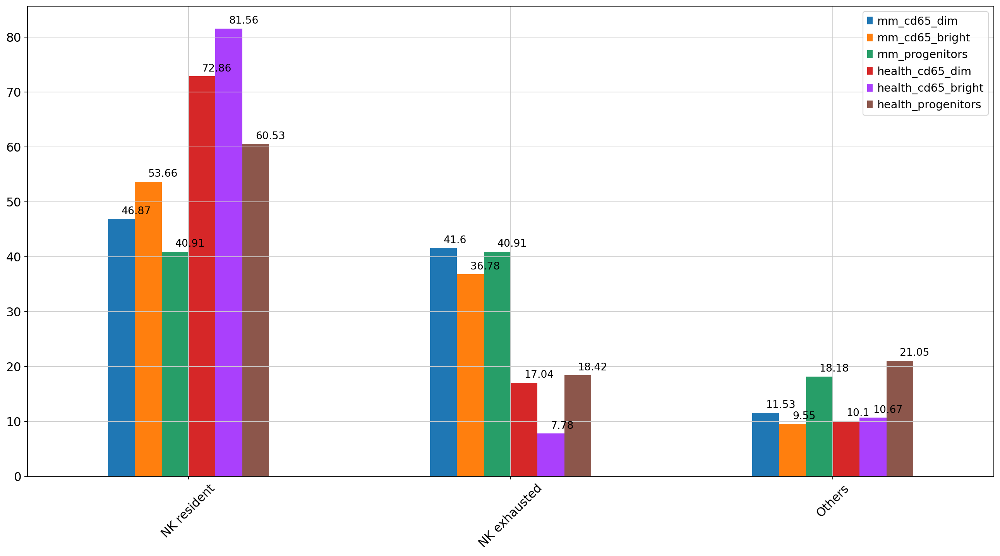

In [23]:
cells = pd.DataFrame()
cells["mm_cd65_dim"] = mm_cd56_dim_cells["new_label"]
cells["mm_cd65_bright"] = mm_cd56_bright_cells["new_label"]
cells["mm_progenitors"] = mm_prog_cells["new_label"]
cells["health_cd65_dim"] = health_cd56_dim_cells["new_label"]
cells["health_cd65_bright"] = health_cd56_bright_cells["new_label"]
cells["health_progenitors"] = health_prog_cells["new_label"]

fig, ax = plt.subplots()
cells.plot.bar(ax=ax)
plt.xticks(rotation=45)
for p in ax.patches: 
    ax.annotate(np.round(p.get_height(),decimals=2), (p.get_x()+p.get_width()/2, p.get_height()+0.9), size=12)

In [24]:
batches = mm.obs.batch.unique().tolist()
mm_cd56dim= proportions(mm_cd56_dim,batches, "new_label")

mm_cd56bright= proportions(mm_cd56_bright,batches, "new_label")

#mm_progenitors = proportions(mm_prog,batches, "new_label")

batches = healthy.obs.batch.unique().tolist() # healthy batches
health_cd56dim= proportions(health_cd56_dim, batches, "new_label")

health_cd56bright= proportions(health_cd56_bright, batches, "new_label")

#health_progenitors = proportions(health_prog,batches, "new_label")

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

health_cd56dim vs. health_cd56bright: Custom statistical test, P_val:3.525e-02
health_cd56dim vs. mm_cd56dim: Custom statistical test, P_val:3.282e-06
health_cd56bright vs. mm_cd56bright: Custom statistical test, P_val:2.332e-05


Text(0.5, 1.0, 'NK resident')

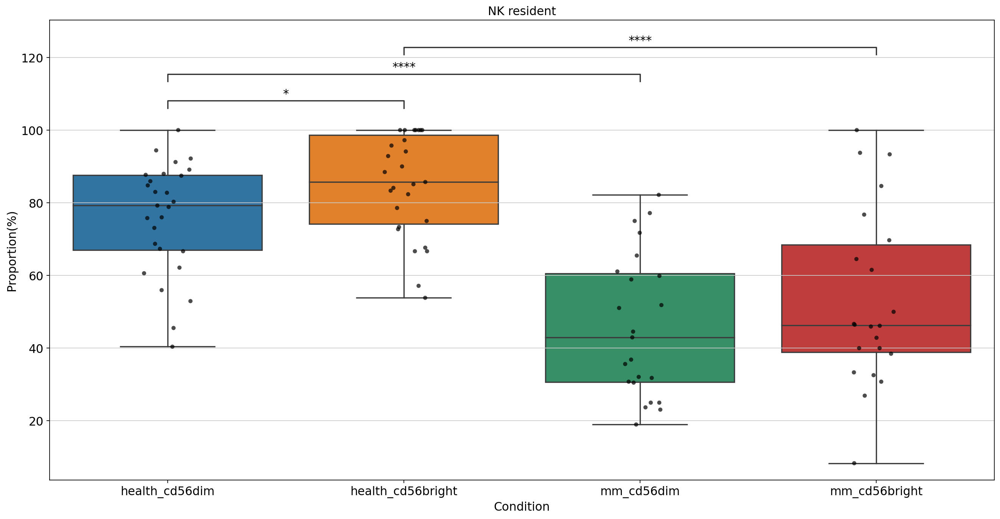







p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

health_cd56dim vs. mm_cd56dim: Custom statistical test, P_val:1.371e-06
health_cd56bright vs. mm_cd56bright: Custom statistical test, P_val:7.040e-06


Text(0.5, 1.0, 'NK exhausted')

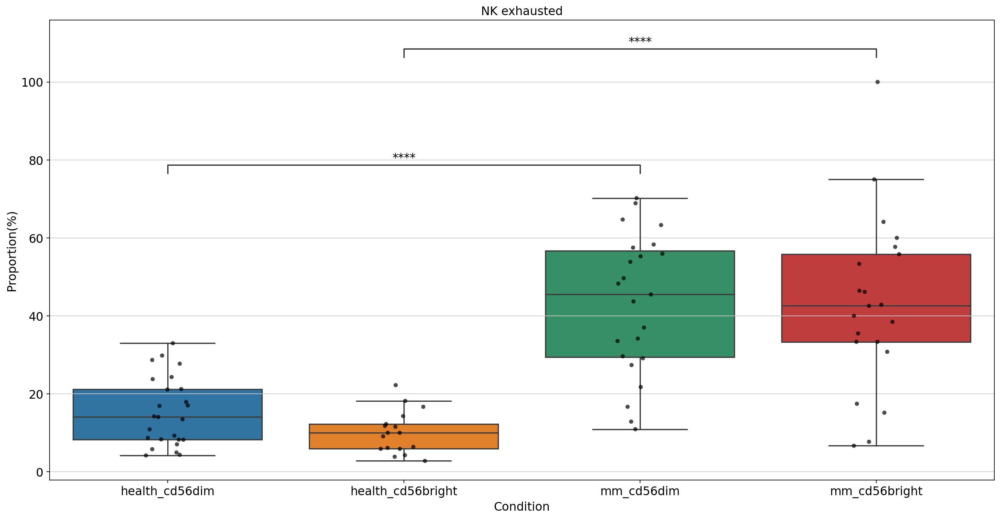







p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

health_cd56dim vs. health_cd56bright: Custom statistical test, P_val:3.359e-02


Text(0.5, 1.0, 'Others')

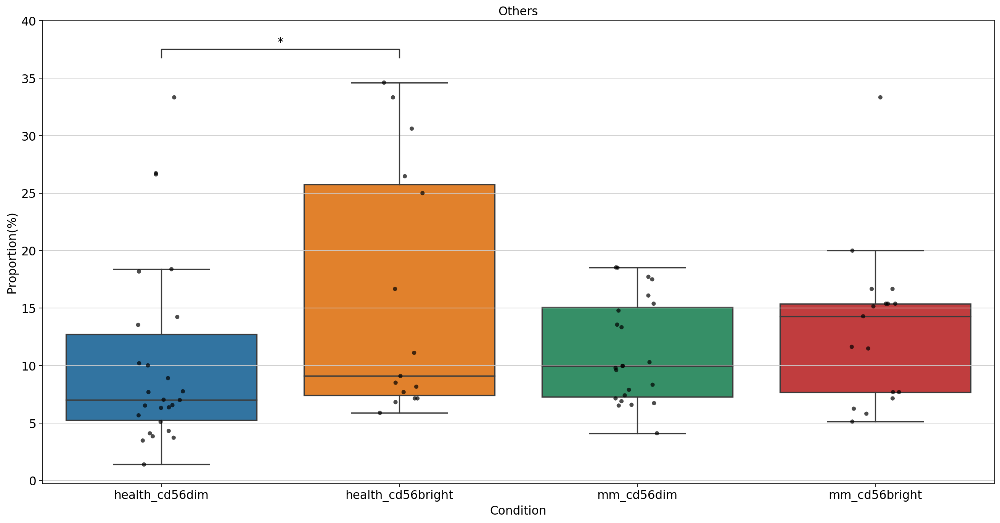

In [25]:
conditions = ["health_cd56dim", "health_cd56bright", "mm_cd56dim", "mm_cd56bright"] # list conditions as string
tables = [health_cd56dim, health_cd56bright, mm_cd56dim, mm_cd56bright] # list of conditions dataframes
list_cells = mm.obs.new_label.value_counts().index

cell_proportions = {} #create new empty dictionary to iterate all the cell types
cell_proportions_long = {}

for c in list_cells:
    cell_proportions[c], cell_proportions_long[c] = celltype(c, conditions, tables)

cells = pd.concat(cell_proportions_long,ignore_index=True) # concatenate the cells
cells.columns = ["cell", "condition", "proportions"]
#cells.to_csv("exhausted_proportions_tidy.csv",index=False)
pairs=[("health_cd56dim", "health_cd56bright"),
       ("health_cd56dim", "mm_cd56dim"),
       ("health_cd56bright", "mm_cd56bright"),
       ("mm_cd56dim","mm_cd56bright")]
significant = statistics()

Interestingly the proportion of exhausted or resident cells doesn't change between CD56<sup>dim</sup> or CD56<sup>bright</sup> cells and the significative differences remains only between health and disease samples.

## Markers

Markers in MM samples


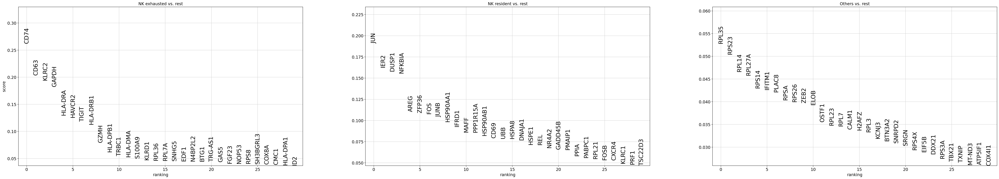

Markers in Healthy samples


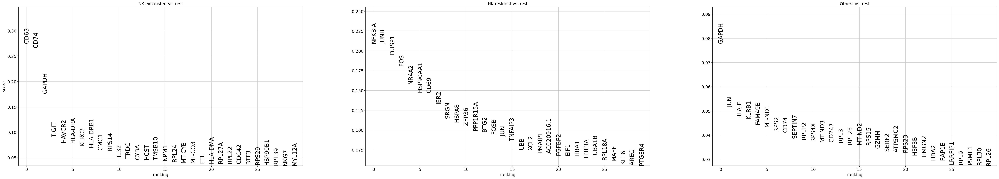

In [26]:
# firstly preprocells the count matrics:
sc.pp.normalize_total(adata, target_sum=1e6) #counts per milion
sc.pp.log1p(adata) # Logarithmize
sc.pp.scale(adata)

print("Markers in MM samples")
sc.tl.rank_genes_groups(adata=mm, groupby='new_label', method="logreg")
sc.pl.rank_genes_groups(mm, n_genes=30,sharey=False, fontsize=20)
print("Markers in Healthy samples")
sc.tl.rank_genes_groups(adata=healthy, groupby='new_label', method="logreg")
sc.pl.rank_genes_groups(healthy, n_genes=30,sharey=False, fontsize=20)

In [27]:
mm_markers = pd.DataFrame(mm.uns["rank_genes_groups"]["names"])
mm_markers = mm_markers[:50]
mm_markers.to_csv("nk_analysis/mm_markers.csv", index=False)
healthy_markers = pd.DataFrame(healthy.uns["rank_genes_groups"]["names"])
healthy_markers = healthy_markers[:50]
healthy_markers.to_csv("nk_analysis/healthy_markers.csv", index=False)

In [28]:
def venn(label):
    plt.figure(figsize=(8,10))
    v = venn2([set(mm_markers[label].to_list()), 
           set(healthy_markers[label].to_list())],
           set_labels=('MM', 'Healthy')
         )
    plt.title(label)

    for text in v.set_labels:
        text.set_fontsize(14)

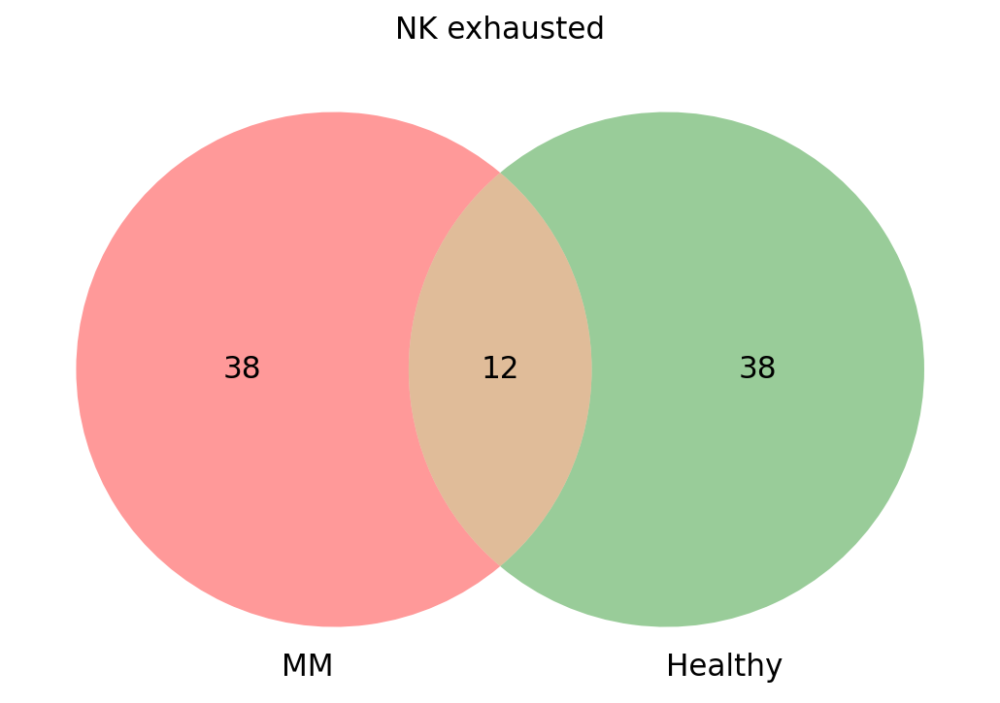

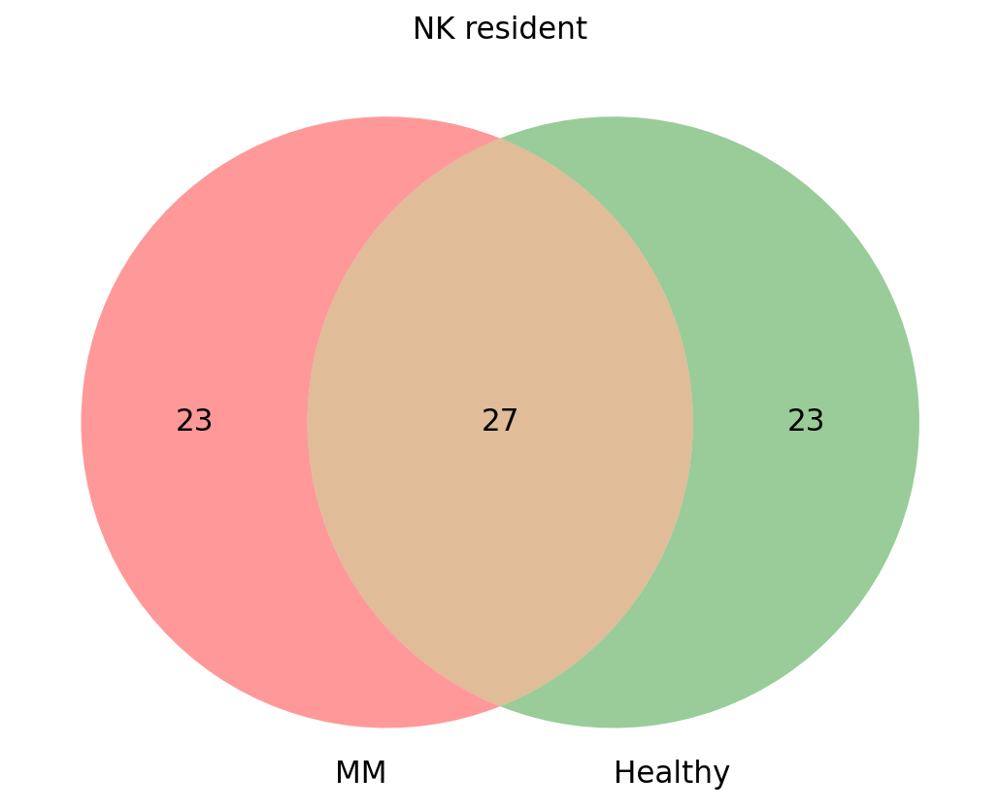

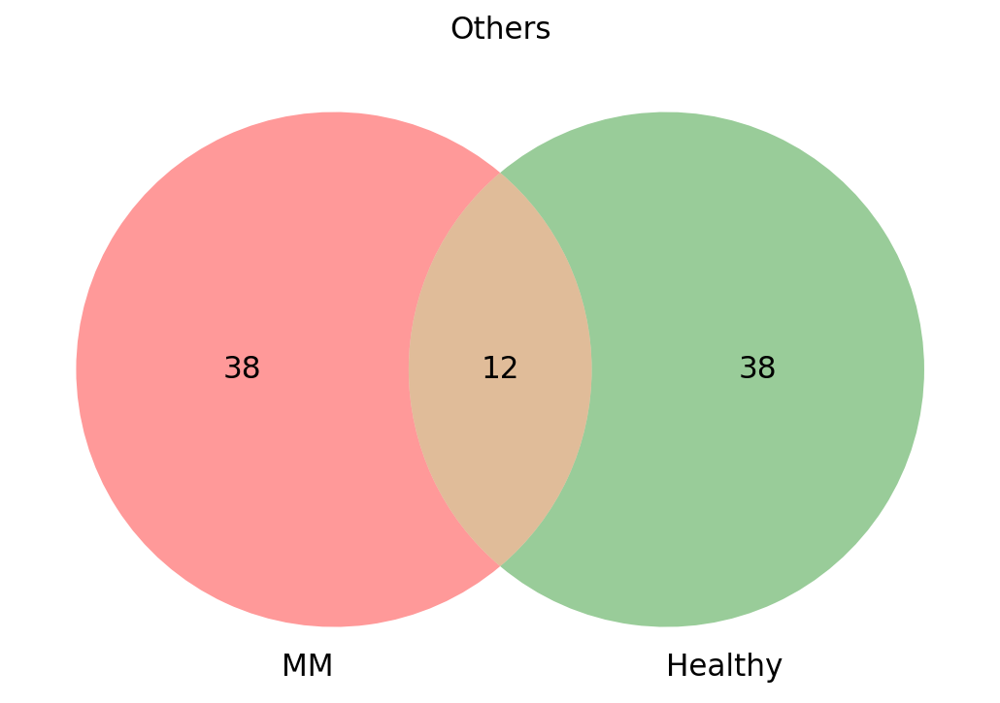

In [29]:
venn("NK exhausted")
venn("NK resident")
venn("Others")

## Conclusions

- Cell type proportions doesn't significantly change among the disease stages and the healthy controls
- The proportion of exhausted cells is higher in disease samples
- Also the unlabelled cells are higher in disease samples
- The proportions of exhauted cells is similar between CD56<sup>dim</sup> and CD56<sup>dim</sup> in disease samples
- Resident and other NK cells have significant different proprtions bethween the CD56<sup>dim</sup> and CD56<sup>dim</sup> in healthy samplses
- Interestingly the NK progenitors in MM looks having an higher number of exhausted cells compared to resident cells but the small number of them doesn't allow to do a sigificative statistical analysis
- The markers between healthy and MM samples are different, suggesting differen mechanism of exhaustion.
- Other cells show really small common markers between MM and Healthy samples, suggesting those groups are composed of mixed cell types
- new analyses of differential gene expression could help to unveil the features of exhausted cells between the two conditions.
